At the time of uploading, the results for this assignment was obtained by running through local machines. Therefore the training accuracies and other related evaluation metrics may slightly differ. This due to time,and resource constraint of google colab runtime GPUs when training for deep learning models.

# 1.Importing necessary Libraries and Loading the dataset

Importing pytorch and other libraires required for visualization. Setting up cuda and using GPU for faster training.

In [ ]:
# prerequisites
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import Variable
import torchvision.utils as vutils
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import numpy as np
import torchvision
import pickle

In [ ]:
CUDA = True
bs = 128
IMAGE_CHANNEL = 1
Z_DIM = 100
G_HIDDEN = 64
X_DIM = 64
D_HIDDEN = 64
EPOCH_NUM = 15
REAL_LABEL = 1
FAKE_LABEL = 0
lr = 2e-4
seed = 1

In [ ]:
CUDA = CUDA and torch.cuda.is_available()
print("PyTorch version: {}".format(torch.__version__))
if CUDA:
    print("CUDA version: {}\n".format(torch.version.cuda))

if CUDA:
    torch.cuda.manual_seed(seed)

device = torch.device("cuda:0" if CUDA else "cpu")

PyTorch version: 2.0.1
CUDA version: 11.8



Loading the dataset by undergoing it through several transformations such as resizing the images to a large size and normalizing images for faster training.

In [ ]:
# MNIST Dataset loading and transformation
transform = transforms.Compose([
    transforms.Resize(X_DIM),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5, ), std=(0.5,))])

train_dataset = datasets.MNIST(root='./mnist_data/', train=True, transform=transform, download=True)
test_dataset = datasets.MNIST(root='./mnist_data/', train=False, transform=transform, download=False)

# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=bs, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=bs, shuffle=False)

In [ ]:
print('Training Set:\n')
for images, labels in train_loader:
    print('Image batch dimensions:', images.size())
    print('Image label dimensions:', labels.size())
    #print(labels[:10])
    break

Training Set:

Image batch dimensions: torch.Size([128, 1, 64, 64])
Image label dimensions: torch.Size([128])


Visualising the loaded images

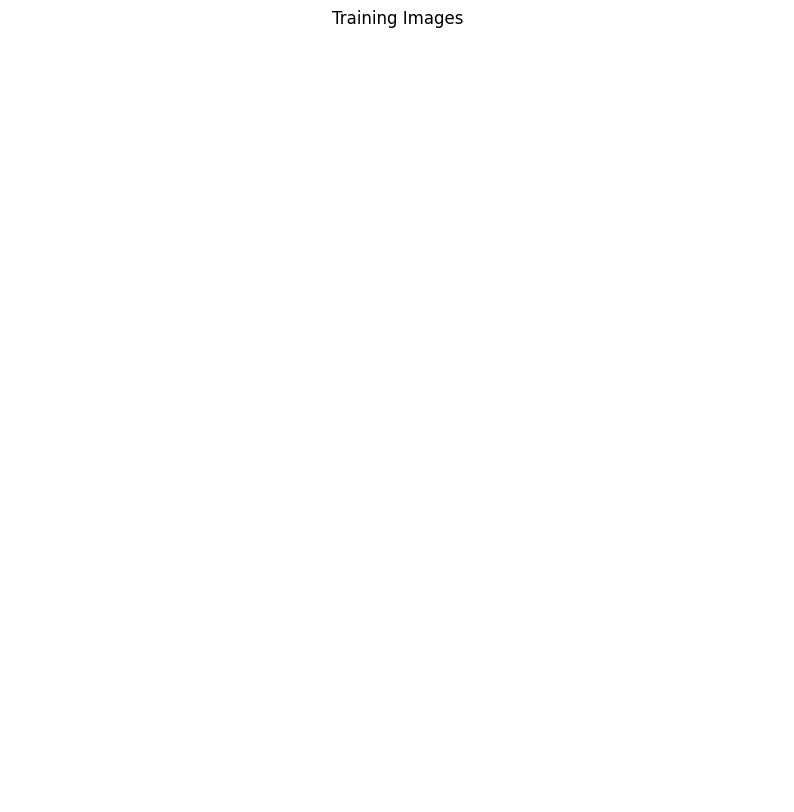

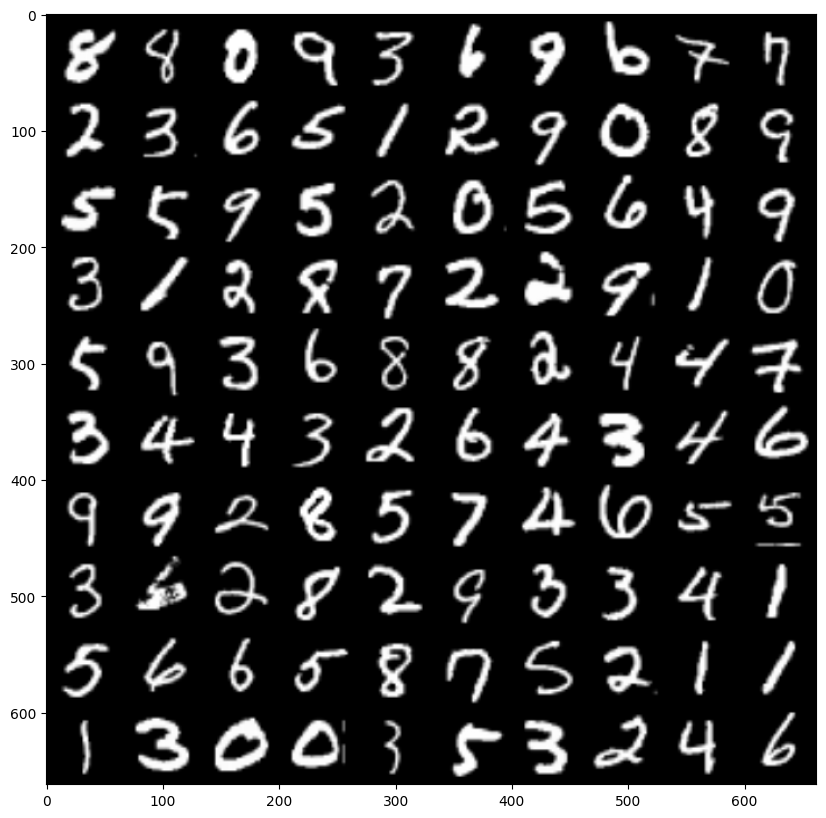

In [ ]:
# Get a batch of training images
images, labels = next(iter(train_loader))

plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Training Images")
grid_1 = vutils.make_grid(images[:100], nrow=10, padding=2, normalize=True)  # Create a grid of images
plt.figure(figsize=(10, 10))
plt.imshow(np.transpose(grid_1, (1, 2, 0)))
plt.show()

# 2.Defining the GAN Model and training the Model

For reduced training time and break of symmetry weight initialization is done to both Generator and Discriminator Models. The weights are initialised such that weights of layers with name 'Conv' have weights initialised with a mean of 0 and std of 0.02. The BatchNorm layer has also been done with different mean and std while the biases initialised to 0.

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

The generator module consists 4 hidden layers with each layer consisting of a deconvolutional layer, BatchNorm layer, and an activation layer which is either ReLU or Tanh(only for output layer). The generator takes a noise vector of 100 dimensions and provides a grayscale image of 64x64 dimension.

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # input layer
            nn.ConvTranspose2d(Z_DIM, G_HIDDEN * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(G_HIDDEN * 8),
            nn.ReLU(True),
            # 1st hidden layer
            nn.ConvTranspose2d(G_HIDDEN * 8, G_HIDDEN * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(G_HIDDEN * 4),
            nn.ReLU(True),
            # 2nd hidden layer
            nn.ConvTranspose2d(G_HIDDEN * 4, G_HIDDEN * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(G_HIDDEN * 2),
            nn.ReLU(True),
            # 3rd hidden layer
            nn.ConvTranspose2d(G_HIDDEN * 2, G_HIDDEN, 4, 2, 1, bias=False),
            nn.BatchNorm2d(G_HIDDEN),
            nn.ReLU(True),
            # output layer
            nn.ConvTranspose2d(G_HIDDEN, IMAGE_CHANNEL, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # 1st layer
            nn.Conv2d(IMAGE_CHANNEL, D_HIDDEN, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # 2nd layer
            nn.Conv2d(D_HIDDEN, D_HIDDEN * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(D_HIDDEN * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # 3rd layer
            nn.Conv2d(D_HIDDEN * 2, D_HIDDEN * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(D_HIDDEN * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # 4th layer
            nn.Conv2d(D_HIDDEN * 4, D_HIDDEN * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(D_HIDDEN * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # output layer
            nn.Conv2d(D_HIDDEN * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input).view(-1, 1).squeeze(1)

Initialising weights to discriminator and generator.

In [ ]:
netG = Generator().to(device)
netG.apply(weights_init)
print(netG)

# Create the discriminator
netD = Discriminator().to(device)
netD.apply(weights_init)
print(netD)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


Defining the loss as Binary cross entropy, using adam optimization and setting up same learning rates for both discriminator and generator.

In [ ]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that I will use to visualize the progression of the generator
viz_noise = torch.randn(bs, Z_DIM, 1, 1, device=device)

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999))

Defining the training steps for discriminator and generator. At the end of each epoch the losses, accuracies and generated images of generator are depicted.

Starting Training Loop...
[0/15][0/469]	Loss_D: 1.9333	Loss_G: 5.6024	D(x): 0.7566	D(G(z)): 0.7259 / 0.0068
[0/15][50/469]	Loss_D: 0.0320	Loss_G: 10.9645	D(x): 0.9825	D(G(z)): 0.0000 / 0.0000
[0/15][100/469]	Loss_D: 0.0960	Loss_G: 5.0231	D(x): 0.9583	D(G(z)): 0.0414 / 0.0116
[0/15][150/469]	Loss_D: 0.1563	Loss_G: 2.6614	D(x): 0.9241	D(G(z)): 0.0617 / 0.1021
[0/15][200/469]	Loss_D: 0.1814	Loss_G: 5.7058	D(x): 0.9726	D(G(z)): 0.1294 / 0.0054
[0/15][250/469]	Loss_D: 0.6311	Loss_G: 3.9682	D(x): 0.8685	D(G(z)): 0.3363 / 0.0280
[0/15][300/469]	Loss_D: 0.5865	Loss_G: 4.8417	D(x): 0.9752	D(G(z)): 0.3538 / 0.0142
[0/15][350/469]	Loss_D: 0.6795	Loss_G: 0.3079	D(x): 0.8059	D(G(z)): 0.2965 / 0.7647
[0/15][400/469]	Loss_D: 0.3239	Loss_G: 4.5700	D(x): 0.9770	D(G(z)): 0.2307 / 0.0179
[0/15][450/469]	Loss_D: 0.2869	Loss_G: 2.9829	D(x): 0.8948	D(G(z)): 0.1434 / 0.0739
Epoch 0 - Training Accuracy - Real: 0.0314, Fake: 0.9686, Total: 0.5000


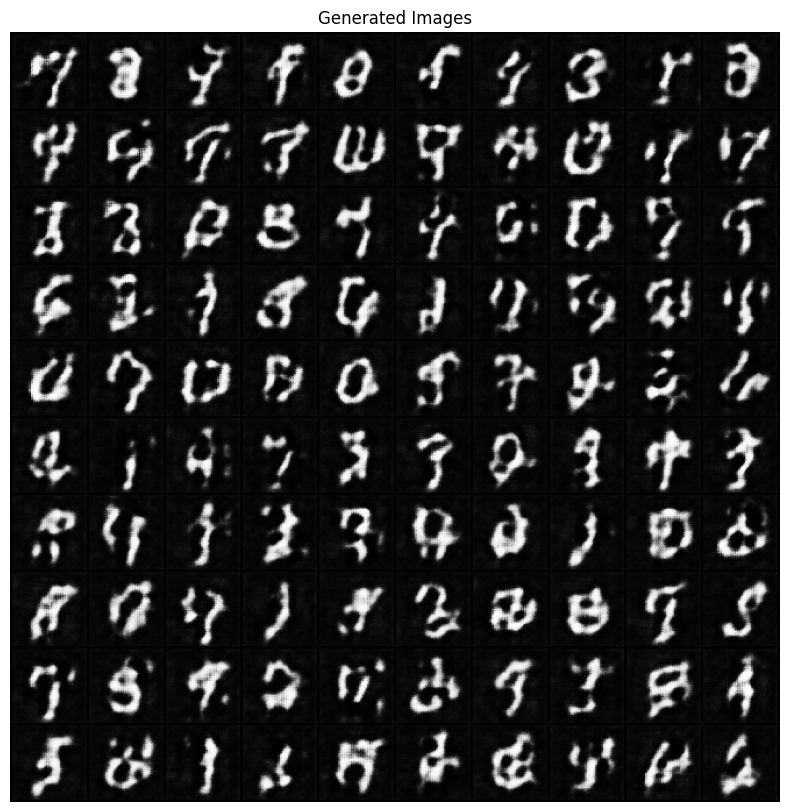

[1/15][0/469]	Loss_D: 0.6992	Loss_G: 1.5691	D(x): 0.5983	D(G(z)): 0.0678 / 0.2727
[1/15][50/469]	Loss_D: 3.8037	Loss_G: 1.6667	D(x): 0.0511	D(G(z)): 0.0012 / 0.3091
[1/15][100/469]	Loss_D: 0.2705	Loss_G: 2.7178	D(x): 0.9153	D(G(z)): 0.1542 / 0.0869
[1/15][150/469]	Loss_D: 0.3536	Loss_G: 2.7196	D(x): 0.9535	D(G(z)): 0.2473 / 0.0834
[1/15][200/469]	Loss_D: 0.6359	Loss_G: 1.6978	D(x): 0.7260	D(G(z)): 0.2331 / 0.2164
[1/15][250/469]	Loss_D: 0.2619	Loss_G: 2.3529	D(x): 0.8433	D(G(z)): 0.0759 / 0.1225
[1/15][300/469]	Loss_D: 1.4975	Loss_G: 0.8749	D(x): 0.3117	D(G(z)): 0.0664 / 0.4832
[1/15][350/469]	Loss_D: 0.3092	Loss_G: 2.6519	D(x): 0.8749	D(G(z)): 0.1442 / 0.0938
[1/15][400/469]	Loss_D: 0.3869	Loss_G: 2.0899	D(x): 0.8559	D(G(z)): 0.1899 / 0.1491
[1/15][450/469]	Loss_D: 0.2557	Loss_G: 2.6781	D(x): 0.8686	D(G(z)): 0.0962 / 0.0878
Epoch 1 - Training Accuracy - Real: 0.0629, Fake: 0.9371, Total: 0.5000


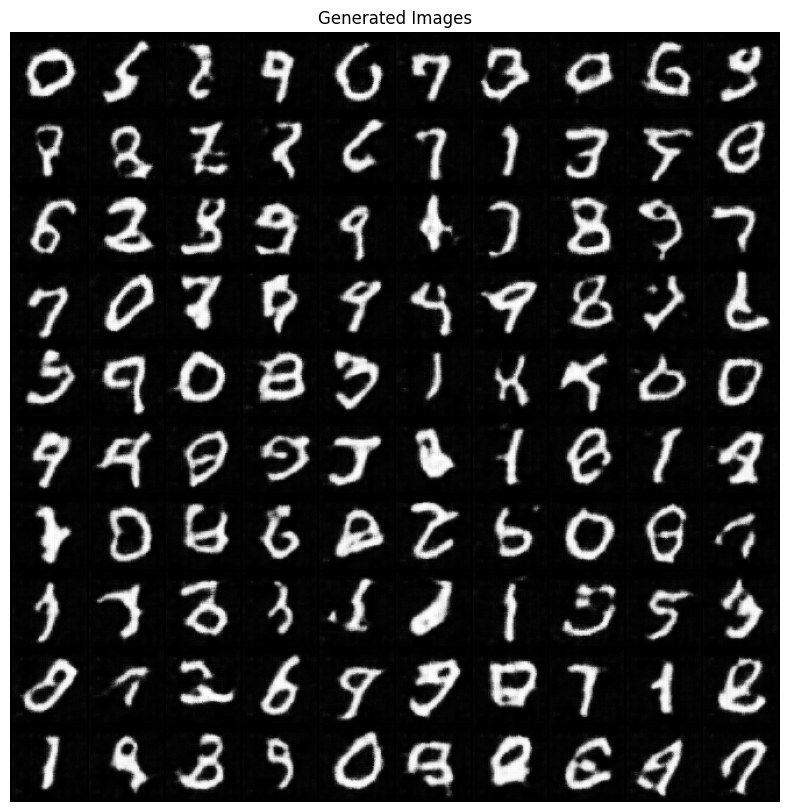

[2/15][0/469]	Loss_D: 0.7472	Loss_G: 3.5232	D(x): 0.9080	D(G(z)): 0.4351 / 0.0382
[2/15][50/469]	Loss_D: 0.3088	Loss_G: 3.2443	D(x): 0.9148	D(G(z)): 0.1829 / 0.0523
[2/15][100/469]	Loss_D: 0.3149	Loss_G: 2.3908	D(x): 0.8586	D(G(z)): 0.1276 / 0.1153
[2/15][150/469]	Loss_D: 1.3591	Loss_G: 1.0937	D(x): 0.4286	D(G(z)): 0.0864 / 0.4303
[2/15][200/469]	Loss_D: 1.0224	Loss_G: 5.1559	D(x): 0.9826	D(G(z)): 0.5734 / 0.0099
[2/15][250/469]	Loss_D: 0.4359	Loss_G: 2.0340	D(x): 0.7827	D(G(z)): 0.1436 / 0.1617
[2/15][300/469]	Loss_D: 0.4770	Loss_G: 2.7567	D(x): 0.8184	D(G(z)): 0.2095 / 0.0830
[2/15][350/469]	Loss_D: 0.7559	Loss_G: 3.2198	D(x): 0.8769	D(G(z)): 0.4113 / 0.0538
[2/15][400/469]	Loss_D: 4.1822	Loss_G: 6.0947	D(x): 0.9986	D(G(z)): 0.9652 / 0.0093
[2/15][450/469]	Loss_D: 0.3746	Loss_G: 3.4163	D(x): 0.9276	D(G(z)): 0.2326 / 0.0454
Epoch 2 - Training Accuracy - Real: 0.0639, Fake: 0.9361, Total: 0.5000


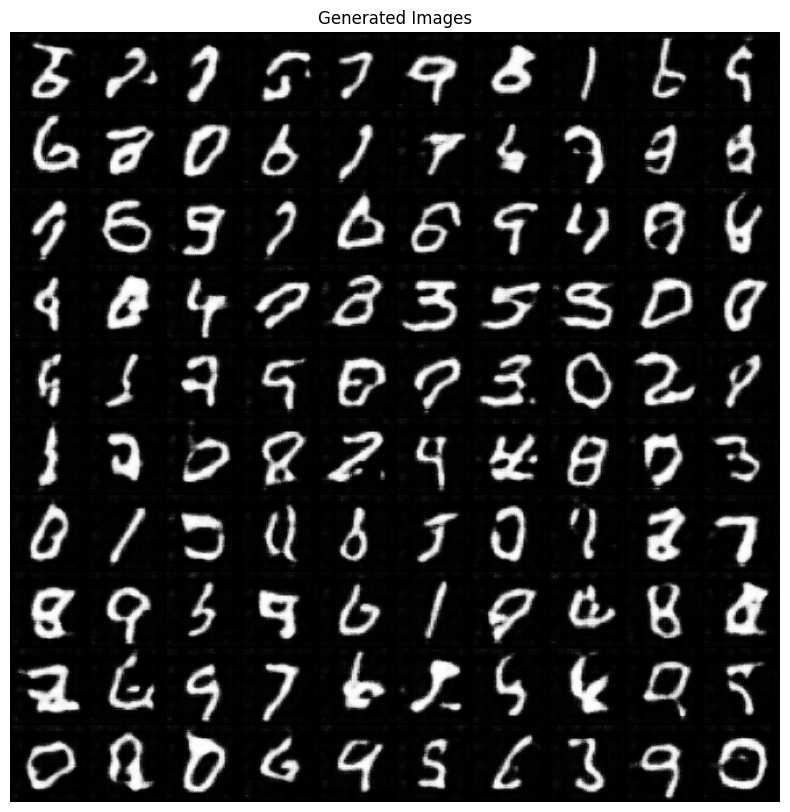

[3/15][0/469]	Loss_D: 1.7460	Loss_G: 3.0081	D(x): 0.9134	D(G(z)): 0.7274 / 0.0754
[3/15][50/469]	Loss_D: 0.4364	Loss_G: 2.1554	D(x): 0.8163	D(G(z)): 0.1828 / 0.1494
[3/15][100/469]	Loss_D: 0.1442	Loss_G: 4.0374	D(x): 0.9375	D(G(z)): 0.0687 / 0.0275
[3/15][150/469]	Loss_D: 1.8782	Loss_G: 4.0608	D(x): 0.7652	D(G(z)): 0.7065 / 0.0338
[3/15][200/469]	Loss_D: 0.9928	Loss_G: 1.8876	D(x): 0.6187	D(G(z)): 0.3422 / 0.1875
[3/15][250/469]	Loss_D: 0.4037	Loss_G: 2.0311	D(x): 0.7751	D(G(z)): 0.1004 / 0.1634
[3/15][300/469]	Loss_D: 0.2752	Loss_G: 3.0532	D(x): 0.8592	D(G(z)): 0.0943 / 0.0662
[3/15][350/469]	Loss_D: 0.1895	Loss_G: 4.3202	D(x): 0.9413	D(G(z)): 0.1137 / 0.0184
[3/15][400/469]	Loss_D: 0.5766	Loss_G: 2.4915	D(x): 0.7279	D(G(z)): 0.1848 / 0.1100
[3/15][450/469]	Loss_D: 0.2392	Loss_G: 2.8316	D(x): 0.8962	D(G(z)): 0.1131 / 0.0739
Epoch 3 - Training Accuracy - Real: 0.0400, Fake: 0.9600, Total: 0.5000


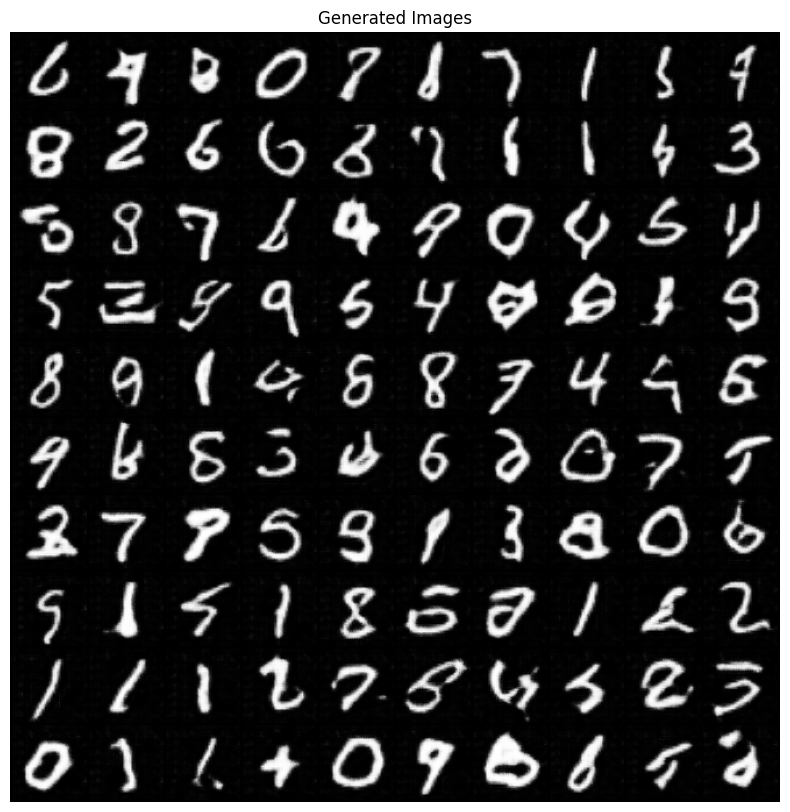

[4/15][0/469]	Loss_D: 0.1843	Loss_G: 3.8106	D(x): 0.9166	D(G(z)): 0.0841 / 0.0332
[4/15][50/469]	Loss_D: 0.3597	Loss_G: 3.4063	D(x): 0.8388	D(G(z)): 0.1484 / 0.0440
[4/15][100/469]	Loss_D: 0.1982	Loss_G: 3.7211	D(x): 0.8697	D(G(z)): 0.0463 / 0.0378
[4/15][150/469]	Loss_D: 0.9024	Loss_G: 2.9570	D(x): 0.8310	D(G(z)): 0.4621 / 0.0713
[4/15][200/469]	Loss_D: 0.3234	Loss_G: 3.2165	D(x): 0.7881	D(G(z)): 0.0471 / 0.0631
[4/15][250/469]	Loss_D: 0.2885	Loss_G: 3.0068	D(x): 0.8006	D(G(z)): 0.0464 / 0.0702
[4/15][300/469]	Loss_D: 0.5957	Loss_G: 1.5872	D(x): 0.6504	D(G(z)): 0.0828 / 0.2549
[4/15][350/469]	Loss_D: 0.0738	Loss_G: 3.8304	D(x): 0.9753	D(G(z)): 0.0460 / 0.0327
[4/15][400/469]	Loss_D: 0.1713	Loss_G: 2.4845	D(x): 0.8794	D(G(z)): 0.0321 / 0.1162
[4/15][450/469]	Loss_D: 0.2597	Loss_G: 2.3353	D(x): 0.8232	D(G(z)): 0.0461 / 0.1348
Epoch 4 - Training Accuracy - Real: 0.0349, Fake: 0.9651, Total: 0.5000


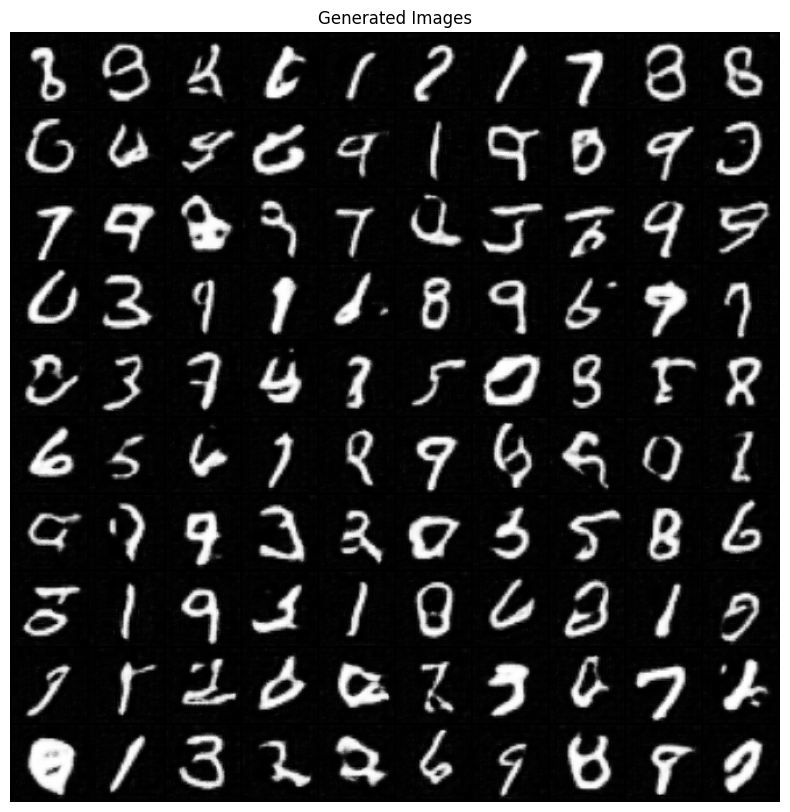

[5/15][0/469]	Loss_D: 0.2102	Loss_G: 2.7533	D(x): 0.8976	D(G(z)): 0.0860 / 0.0880
[5/15][50/469]	Loss_D: 0.7151	Loss_G: 1.8520	D(x): 0.6084	D(G(z)): 0.1185 / 0.1965
[5/15][100/469]	Loss_D: 0.2307	Loss_G: 3.1961	D(x): 0.9082	D(G(z)): 0.1148 / 0.0555
[5/15][150/469]	Loss_D: 0.1279	Loss_G: 3.8606	D(x): 0.9507	D(G(z)): 0.0684 / 0.0331
[5/15][200/469]	Loss_D: 0.3519	Loss_G: 4.1632	D(x): 0.9489	D(G(z)): 0.2396 / 0.0216
[5/15][250/469]	Loss_D: 0.8548	Loss_G: 6.6200	D(x): 0.9914	D(G(z)): 0.5129 / 0.0022
[5/15][300/469]	Loss_D: 1.6203	Loss_G: 2.9810	D(x): 0.9396	D(G(z)): 0.7093 / 0.0787
[5/15][350/469]	Loss_D: 0.3219	Loss_G: 3.0596	D(x): 0.8312	D(G(z)): 0.1069 / 0.0653
[5/15][400/469]	Loss_D: 0.1014	Loss_G: 4.0569	D(x): 0.9601	D(G(z)): 0.0563 / 0.0259
[5/15][450/469]	Loss_D: 0.4854	Loss_G: 5.6040	D(x): 0.9393	D(G(z)): 0.3058 / 0.0055
Epoch 5 - Training Accuracy - Real: 0.0511, Fake: 0.9489, Total: 0.5000


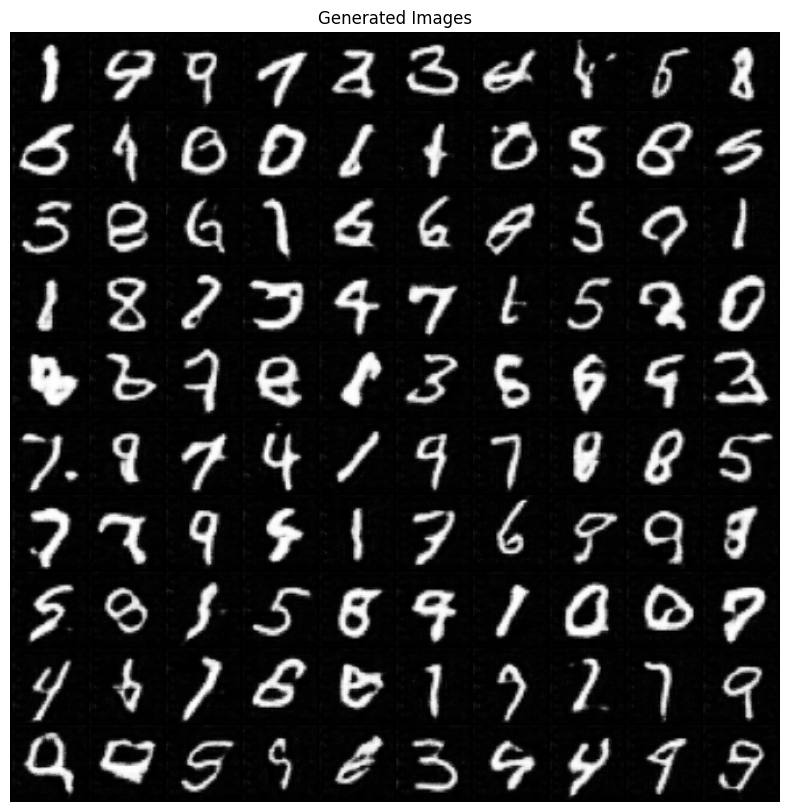

[6/15][0/469]	Loss_D: 0.3042	Loss_G: 4.4837	D(x): 0.9419	D(G(z)): 0.2017 / 0.0151
[6/15][50/469]	Loss_D: 0.1055	Loss_G: 4.1025	D(x): 0.9739	D(G(z)): 0.0728 / 0.0236
[6/15][100/469]	Loss_D: 0.7535	Loss_G: 1.2918	D(x): 0.5989	D(G(z)): 0.1493 / 0.3207
[6/15][150/469]	Loss_D: 0.3906	Loss_G: 3.6530	D(x): 0.7695	D(G(z)): 0.0719 / 0.0406
[6/15][200/469]	Loss_D: 0.6565	Loss_G: 3.0585	D(x): 0.8484	D(G(z)): 0.3448 / 0.0624
[6/15][250/469]	Loss_D: 0.1093	Loss_G: 3.8099	D(x): 0.9556	D(G(z)): 0.0598 / 0.0299
[6/15][300/469]	Loss_D: 0.0555	Loss_G: 4.3251	D(x): 0.9734	D(G(z)): 0.0274 / 0.0189
[6/15][350/469]	Loss_D: 1.1634	Loss_G: 0.1414	D(x): 0.5345	D(G(z)): 0.2397 / 0.8860
[6/15][400/469]	Loss_D: 0.4746	Loss_G: 2.9360	D(x): 0.8773	D(G(z)): 0.2611 / 0.0761
[6/15][450/469]	Loss_D: 1.3862	Loss_G: 3.3474	D(x): 0.8682	D(G(z)): 0.6453 / 0.0509
Epoch 6 - Training Accuracy - Real: 0.0505, Fake: 0.9495, Total: 0.5000


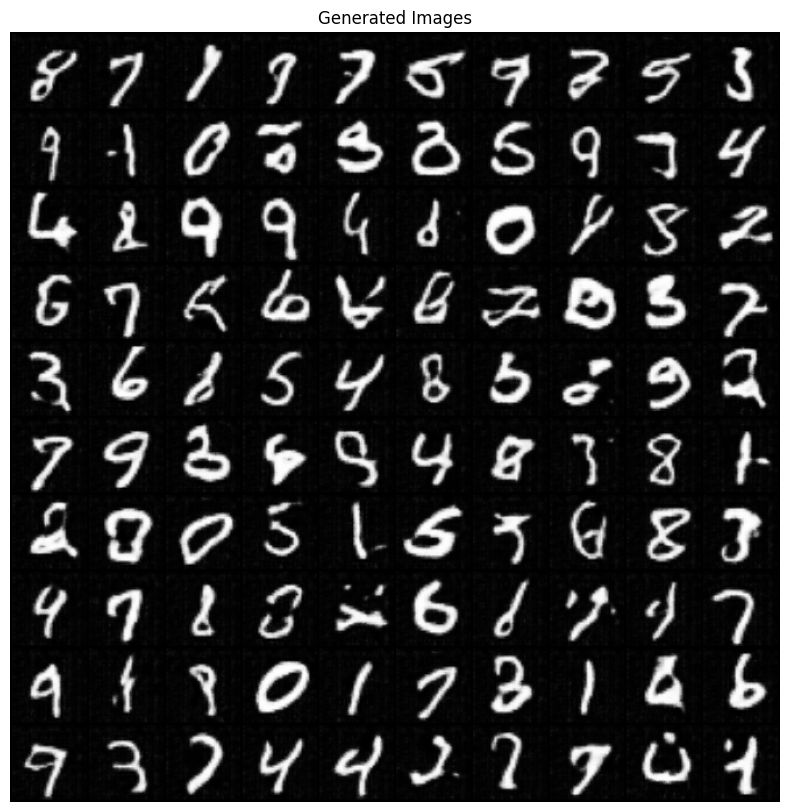

[7/15][0/469]	Loss_D: 0.3896	Loss_G: 2.5824	D(x): 0.8320	D(G(z)): 0.1619 / 0.1032
[7/15][50/469]	Loss_D: 0.2189	Loss_G: 3.3066	D(x): 0.8642	D(G(z)): 0.0575 / 0.0521
[7/15][100/469]	Loss_D: 0.2060	Loss_G: 2.3602	D(x): 0.8484	D(G(z)): 0.0302 / 0.1288
[7/15][150/469]	Loss_D: 0.1151	Loss_G: 3.9664	D(x): 0.9485	D(G(z)): 0.0552 / 0.0280
[7/15][200/469]	Loss_D: 0.3234	Loss_G: 4.7756	D(x): 0.9749	D(G(z)): 0.2347 / 0.0130
[7/15][250/469]	Loss_D: 0.1219	Loss_G: 3.7789	D(x): 0.9059	D(G(z)): 0.0150 / 0.0350
[7/15][300/469]	Loss_D: 1.1169	Loss_G: 0.8997	D(x): 0.4231	D(G(z)): 0.1194 / 0.4604
[7/15][350/469]	Loss_D: 0.3304	Loss_G: 3.1390	D(x): 0.8841	D(G(z)): 0.1624 / 0.0631
[7/15][400/469]	Loss_D: 0.2318	Loss_G: 3.8331	D(x): 0.9261	D(G(z)): 0.1309 / 0.0307
[7/15][450/469]	Loss_D: 0.1118	Loss_G: 3.4954	D(x): 0.9315	D(G(z)): 0.0338 / 0.0411
Epoch 7 - Training Accuracy - Real: 0.0366, Fake: 0.9634, Total: 0.5000


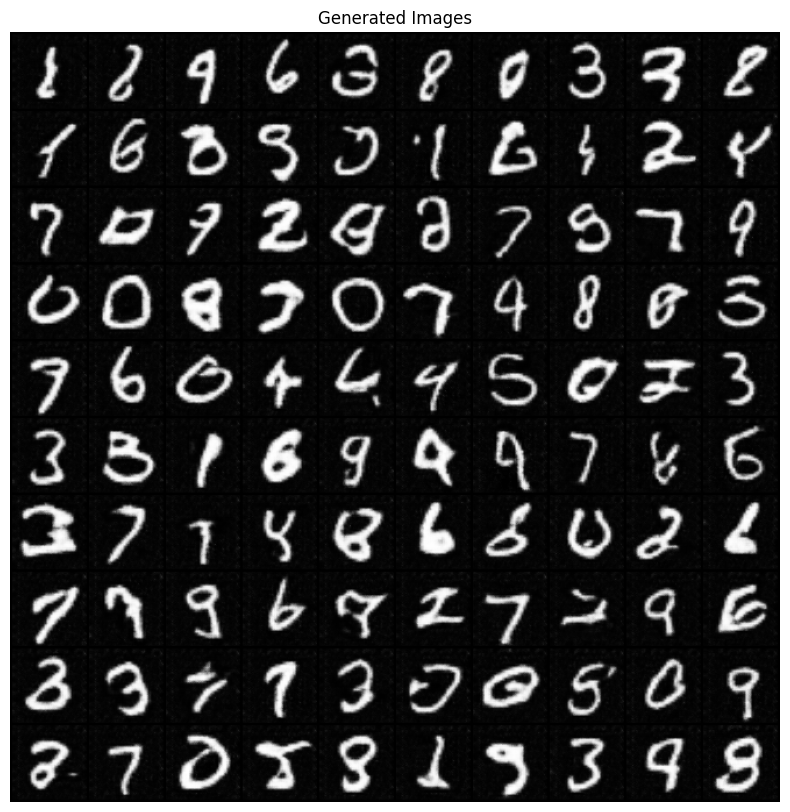

[8/15][0/469]	Loss_D: 0.0601	Loss_G: 4.5096	D(x): 0.9583	D(G(z)): 0.0166 / 0.0169
[8/15][50/469]	Loss_D: 1.0120	Loss_G: 1.9987	D(x): 0.4833	D(G(z)): 0.0366 / 0.2052
[8/15][100/469]	Loss_D: 0.1020	Loss_G: 3.2710	D(x): 0.9281	D(G(z)): 0.0234 / 0.0551
[8/15][150/469]	Loss_D: 0.8685	Loss_G: 0.8132	D(x): 0.4963	D(G(z)): 0.0310 / 0.5125
[8/15][200/469]	Loss_D: 0.2163	Loss_G: 4.6144	D(x): 0.9687	D(G(z)): 0.1531 / 0.0142
[8/15][250/469]	Loss_D: 0.0785	Loss_G: 4.4506	D(x): 0.9828	D(G(z)): 0.0550 / 0.0169
[8/15][300/469]	Loss_D: 0.0460	Loss_G: 4.2207	D(x): 0.9812	D(G(z)): 0.0262 / 0.0210
[8/15][350/469]	Loss_D: 0.2976	Loss_G: 3.6168	D(x): 0.9395	D(G(z)): 0.1904 / 0.0376
[8/15][400/469]	Loss_D: 0.6394	Loss_G: 3.5787	D(x): 0.9563	D(G(z)): 0.3891 / 0.0470
[8/15][450/469]	Loss_D: 0.1044	Loss_G: 3.9818	D(x): 0.9461	D(G(z)): 0.0440 / 0.0304
Epoch 8 - Training Accuracy - Real: 0.0351, Fake: 0.9649, Total: 0.5000


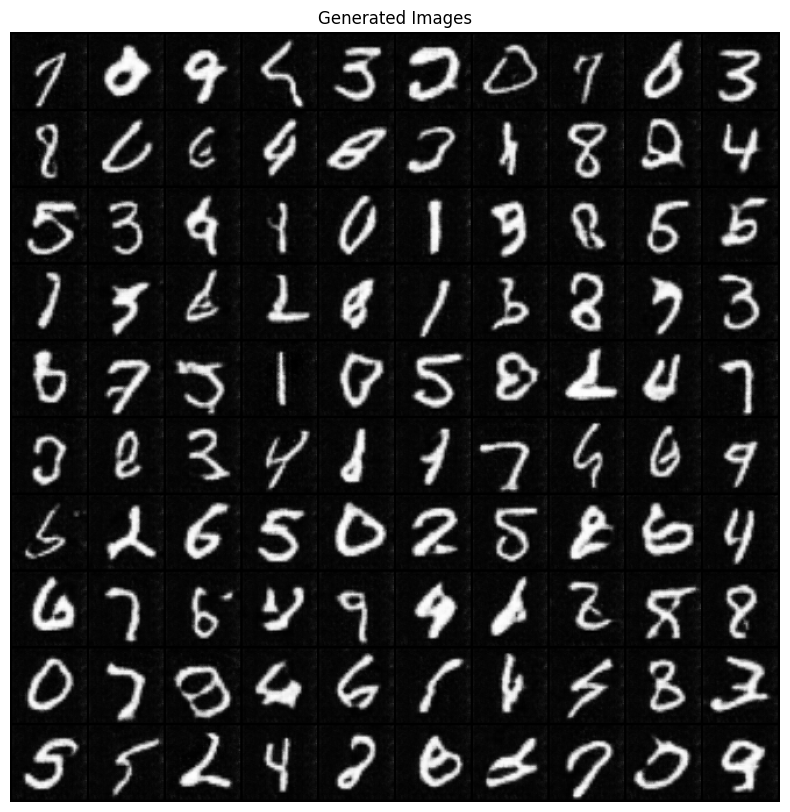

[9/15][0/469]	Loss_D: 0.6126	Loss_G: 2.6410	D(x): 0.8389	D(G(z)): 0.3152 / 0.0941
[9/15][50/469]	Loss_D: 0.3104	Loss_G: 4.5389	D(x): 0.9465	D(G(z)): 0.2024 / 0.0169
[9/15][100/469]	Loss_D: 0.0699	Loss_G: 4.1103	D(x): 0.9666	D(G(z)): 0.0341 / 0.0233
[9/15][150/469]	Loss_D: 0.1186	Loss_G: 3.2307	D(x): 0.8971	D(G(z)): 0.0052 / 0.0596
[9/15][200/469]	Loss_D: 0.0337	Loss_G: 4.1517	D(x): 0.9847	D(G(z)): 0.0178 / 0.0217
[9/15][250/469]	Loss_D: 1.2057	Loss_G: 0.7124	D(x): 0.4448	D(G(z)): 0.2687 / 0.5138
[9/15][300/469]	Loss_D: 0.8487	Loss_G: 1.0224	D(x): 0.5676	D(G(z)): 0.1824 / 0.4143
[9/15][350/469]	Loss_D: 0.9296	Loss_G: 2.3669	D(x): 0.4776	D(G(z)): 0.0474 / 0.1510
[9/15][400/469]	Loss_D: 0.3946	Loss_G: 3.5271	D(x): 0.7695	D(G(z)): 0.0875 / 0.0502
[9/15][450/469]	Loss_D: 0.4180	Loss_G: 2.2503	D(x): 0.7394	D(G(z)): 0.0739 / 0.1413
Epoch 9 - Training Accuracy - Real: 0.0561, Fake: 0.9439, Total: 0.5000


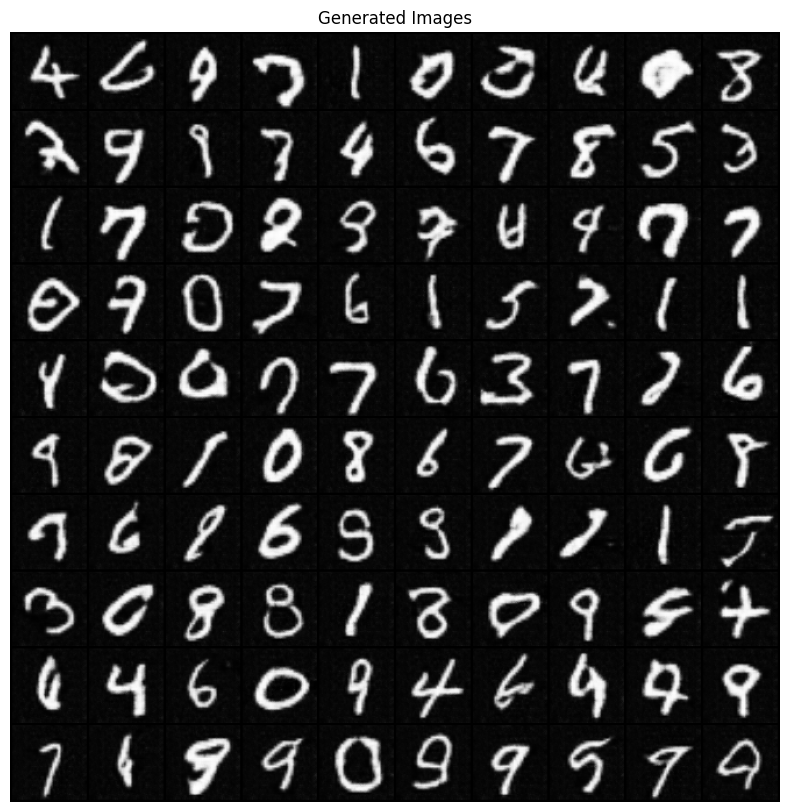

[10/15][0/469]	Loss_D: 0.1279	Loss_G: 4.4522	D(x): 0.9706	D(G(z)): 0.0848 / 0.0171
[10/15][50/469]	Loss_D: 0.0903	Loss_G: 3.7683	D(x): 0.9404	D(G(z)): 0.0265 / 0.0325
[10/15][100/469]	Loss_D: 0.4976	Loss_G: 2.6455	D(x): 0.7354	D(G(z)): 0.1284 / 0.0955
[10/15][150/469]	Loss_D: 1.0611	Loss_G: 2.8371	D(x): 0.8618	D(G(z)): 0.5499 / 0.0790
[10/15][200/469]	Loss_D: 0.5082	Loss_G: 2.3563	D(x): 0.7552	D(G(z)): 0.1531 / 0.1277
[10/15][250/469]	Loss_D: 0.0886	Loss_G: 4.0205	D(x): 0.9539	D(G(z)): 0.0370 / 0.0260
[10/15][300/469]	Loss_D: 0.5592	Loss_G: 3.1116	D(x): 0.8565	D(G(z)): 0.2944 / 0.0650
[10/15][350/469]	Loss_D: 0.7187	Loss_G: 1.5116	D(x): 0.6788	D(G(z)): 0.2344 / 0.2598
[10/15][400/469]	Loss_D: 0.2129	Loss_G: 3.4683	D(x): 0.8683	D(G(z)): 0.0585 / 0.0463
[10/15][450/469]	Loss_D: 0.0605	Loss_G: 4.2512	D(x): 0.9691	D(G(z)): 0.0272 / 0.0215
Epoch 10 - Training Accuracy - Real: 0.0507, Fake: 0.9494, Total: 0.5000


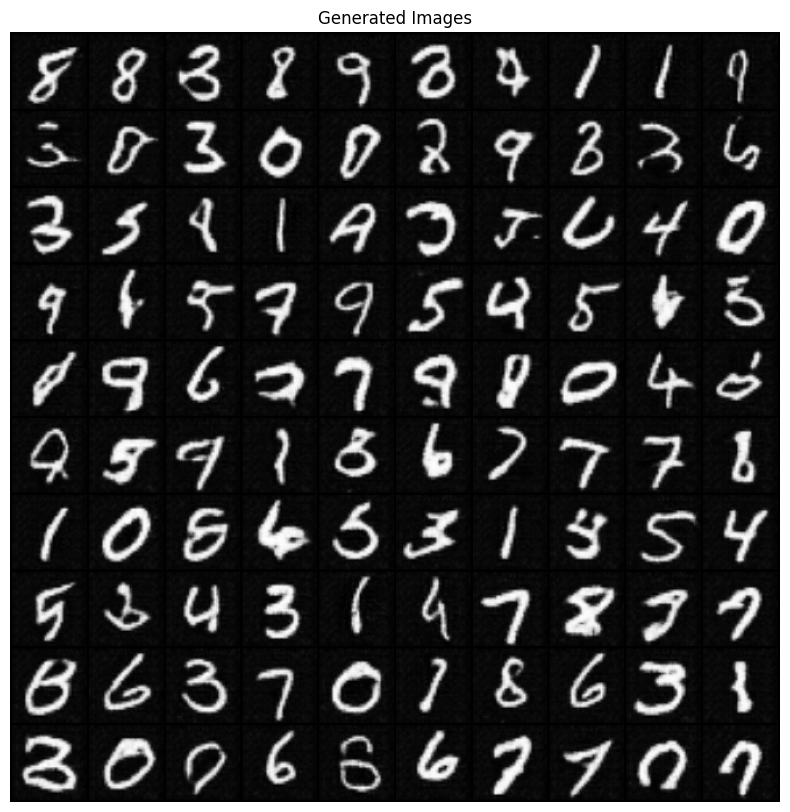

[11/15][0/469]	Loss_D: 0.4196	Loss_G: 2.1718	D(x): 0.8752	D(G(z)): 0.2178 / 0.1526
[11/15][50/469]	Loss_D: 0.4785	Loss_G: 2.8773	D(x): 0.8225	D(G(z)): 0.2066 / 0.0770
[11/15][100/469]	Loss_D: 0.1834	Loss_G: 2.9036	D(x): 0.8884	D(G(z)): 0.0475 / 0.0798
[11/15][150/469]	Loss_D: 0.0508	Loss_G: 4.4031	D(x): 0.9762	D(G(z)): 0.0257 / 0.0184
[11/15][200/469]	Loss_D: 0.0442	Loss_G: 4.3558	D(x): 0.9812	D(G(z)): 0.0245 / 0.0185
[11/15][250/469]	Loss_D: 0.1346	Loss_G: 4.0826	D(x): 0.9547	D(G(z)): 0.0786 / 0.0254
[11/15][300/469]	Loss_D: 0.7557	Loss_G: 7.8221	D(x): 0.9918	D(G(z)): 0.4781 / 0.0006
[11/15][350/469]	Loss_D: 0.1308	Loss_G: 4.4514	D(x): 0.9686	D(G(z)): 0.0905 / 0.0163
[11/15][400/469]	Loss_D: 0.0853	Loss_G: 3.4904	D(x): 0.9303	D(G(z)): 0.0107 / 0.0454
[11/15][450/469]	Loss_D: 0.0494	Loss_G: 4.6556	D(x): 0.9856	D(G(z)): 0.0333 / 0.0150
Epoch 11 - Training Accuracy - Real: 0.0241, Fake: 0.9759, Total: 0.5000


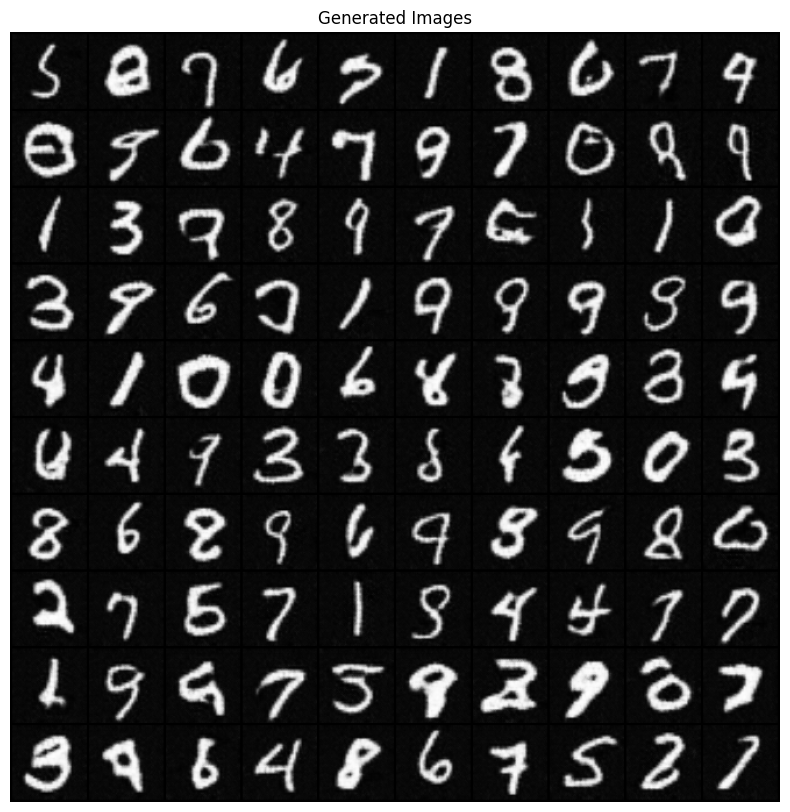

[12/15][0/469]	Loss_D: 0.0542	Loss_G: 4.8036	D(x): 0.9844	D(G(z)): 0.0361 / 0.0134
[12/15][50/469]	Loss_D: 0.8844	Loss_G: 1.6892	D(x): 0.7395	D(G(z)): 0.3986 / 0.2047
[12/15][100/469]	Loss_D: 1.6381	Loss_G: 3.8351	D(x): 0.9783	D(G(z)): 0.6944 / 0.0387
[12/15][150/469]	Loss_D: 0.1002	Loss_G: 4.2655	D(x): 0.9470	D(G(z)): 0.0427 / 0.0216
[12/15][200/469]	Loss_D: 0.1624	Loss_G: 2.8268	D(x): 0.9275	D(G(z)): 0.0777 / 0.0809
[12/15][250/469]	Loss_D: 0.3768	Loss_G: 2.7145	D(x): 0.7360	D(G(z)): 0.0369 / 0.1007
[12/15][300/469]	Loss_D: 0.2249	Loss_G: 3.2340	D(x): 0.9528	D(G(z)): 0.1504 / 0.0569
[12/15][350/469]	Loss_D: 0.2994	Loss_G: 5.5918	D(x): 0.9891	D(G(z)): 0.2284 / 0.0052
[12/15][400/469]	Loss_D: 0.0673	Loss_G: 3.9437	D(x): 0.9719	D(G(z)): 0.0373 / 0.0272
[12/15][450/469]	Loss_D: 0.4731	Loss_G: 2.3422	D(x): 0.7892	D(G(z)): 0.1799 / 0.1173
Epoch 12 - Training Accuracy - Real: 0.0605, Fake: 0.9395, Total: 0.5000


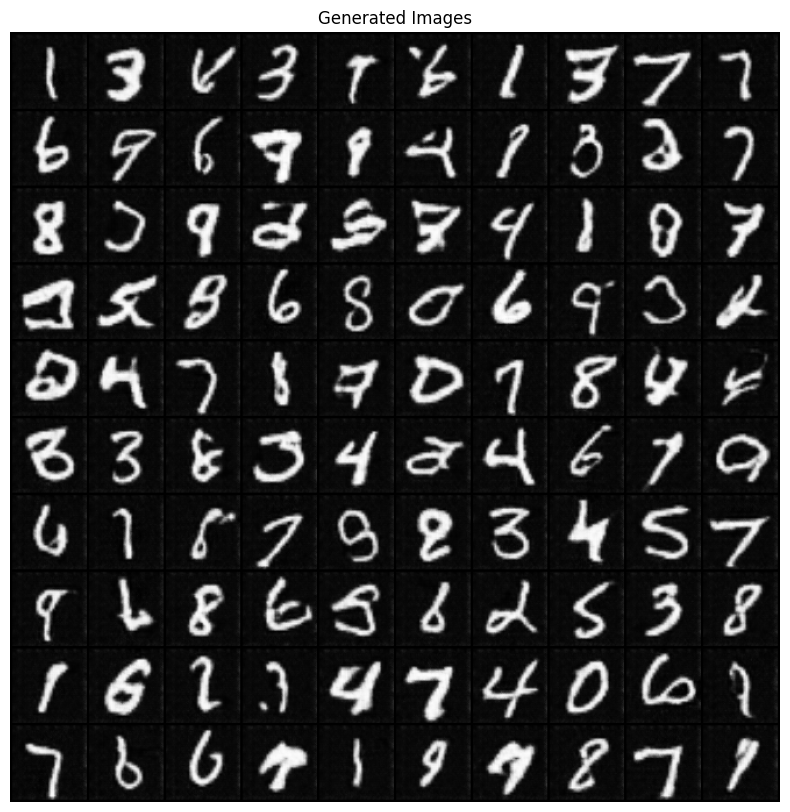

[13/15][0/469]	Loss_D: 0.1665	Loss_G: 3.2207	D(x): 0.9237	D(G(z)): 0.0765 / 0.0607
[13/15][50/469]	Loss_D: 0.0727	Loss_G: 4.0666	D(x): 0.9622	D(G(z)): 0.0318 / 0.0241
[13/15][100/469]	Loss_D: 0.0813	Loss_G: 2.8999	D(x): 0.9410	D(G(z)): 0.0180 / 0.0800
[13/15][150/469]	Loss_D: 0.0867	Loss_G: 3.8451	D(x): 0.9587	D(G(z)): 0.0415 / 0.0331
[13/15][200/469]	Loss_D: 0.1690	Loss_G: 3.5659	D(x): 0.9054	D(G(z)): 0.0557 / 0.0491
[13/15][250/469]	Loss_D: 0.0631	Loss_G: 4.3650	D(x): 0.9797	D(G(z)): 0.0404 / 0.0185
[13/15][300/469]	Loss_D: 0.0294	Loss_G: 4.8437	D(x): 0.9811	D(G(z)): 0.0100 / 0.0127
[13/15][350/469]	Loss_D: 0.0212	Loss_G: 5.4439	D(x): 0.9834	D(G(z)): 0.0043 / 0.0070
[13/15][400/469]	Loss_D: 0.0330	Loss_G: 4.7292	D(x): 0.9780	D(G(z)): 0.0104 / 0.0137
[13/15][450/469]	Loss_D: 0.0296	Loss_G: 5.6116	D(x): 0.9943	D(G(z)): 0.0233 / 0.0055
Epoch 13 - Training Accuracy - Real: 0.0126, Fake: 0.9874, Total: 0.5000


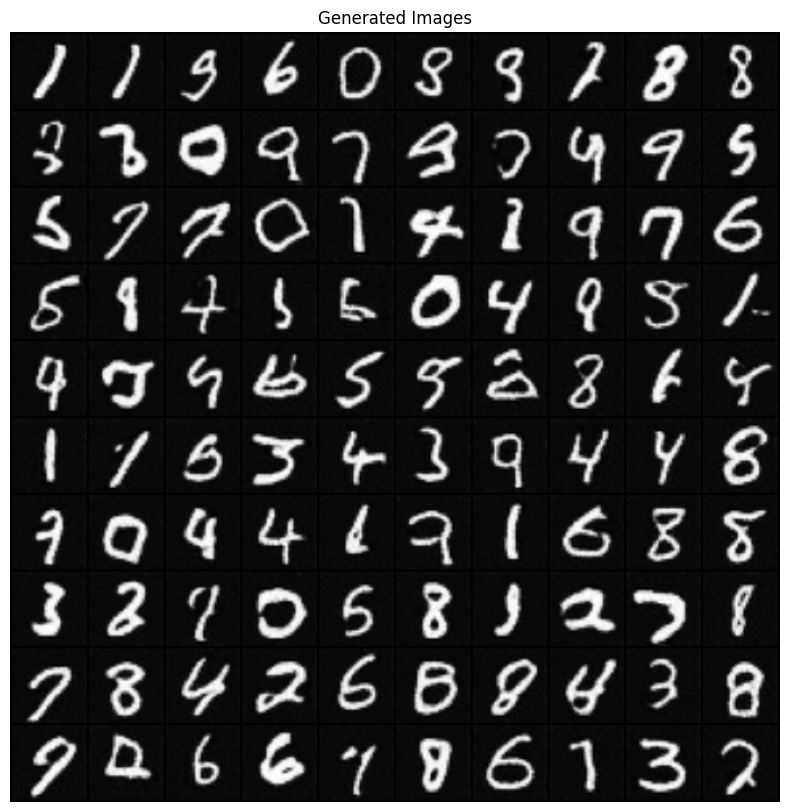

[14/15][0/469]	Loss_D: 0.0252	Loss_G: 4.7859	D(x): 0.9845	D(G(z)): 0.0094 / 0.0134
[14/15][50/469]	Loss_D: 0.6668	Loss_G: 2.5963	D(x): 0.5906	D(G(z)): 0.0048 / 0.1118
[14/15][100/469]	Loss_D: 0.3996	Loss_G: 10.9820	D(x): 0.9962	D(G(z)): 0.2922 / 0.0000
[14/15][150/469]	Loss_D: 0.6970	Loss_G: 5.1552	D(x): 0.9652	D(G(z)): 0.4158 / 0.0094
[14/15][200/469]	Loss_D: 0.1510	Loss_G: 3.5342	D(x): 0.9136	D(G(z)): 0.0539 / 0.0443
[14/15][250/469]	Loss_D: 0.3097	Loss_G: 2.5020	D(x): 0.8728	D(G(z)): 0.1442 / 0.1031
[14/15][300/469]	Loss_D: 0.0532	Loss_G: 4.1274	D(x): 0.9735	D(G(z)): 0.0249 / 0.0259
[14/15][350/469]	Loss_D: 0.2371	Loss_G: 2.1152	D(x): 0.8329	D(G(z)): 0.0391 / 0.1660
[14/15][400/469]	Loss_D: 0.8500	Loss_G: 3.8990	D(x): 0.9511	D(G(z)): 0.4818 / 0.0284
[14/15][450/469]	Loss_D: 0.1321	Loss_G: 4.6898	D(x): 0.9772	D(G(z)): 0.0997 / 0.0131
Epoch 14 - Training Accuracy - Real: 0.0456, Fake: 0.9544, Total: 0.5000


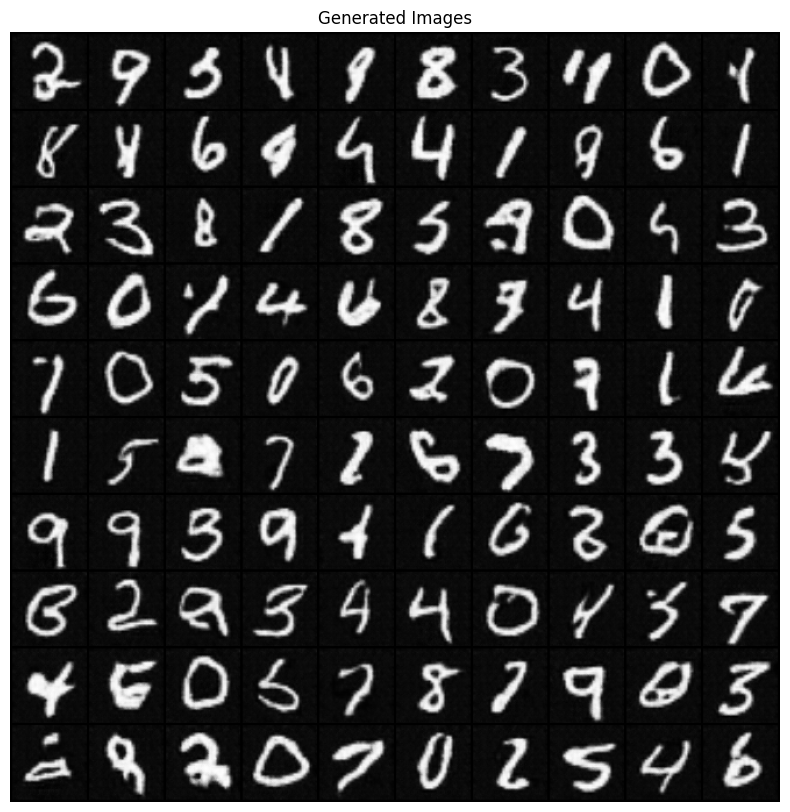

In [ ]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
for epoch in range(EPOCH_NUM):
    # Variables to keep track of correct predictions and total examples
    correct_real = 0
    correct_fake = 0
    total_real = 0
    total_fake = 0

    for i, data in enumerate(train_loader, 0):
        # (1) Update the discriminator with real data
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), REAL_LABEL, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        # (2) Update the discriminator with fake data
        # Generate batch of latent vectors
        noise = torch.randn(b_size, Z_DIM, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(FAKE_LABEL)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        # (3) Update the generator with fake data
        netG.zero_grad()
        label.fill_(REAL_LABEL)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Compute the accuracy
        total_real += label.size(0)
        total_fake += label.size(0)
        correct_real += torch.round(output).eq(label).sum().item()
        correct_fake += torch.round(output).eq(1 - label).sum().item()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, EPOCH_NUM, i, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == EPOCH_NUM - 1) and (i == len(train_loader) - 1)):
            with torch.no_grad():
                fake = netG(viz_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

    # Compute the training accuracy for real and fake data
    acc_real = correct_real / total_real
    acc_fake = correct_fake / total_fake
    acc_total = (correct_real + correct_fake) / (total_real + total_fake)
    print('Epoch %d - Training Accuracy - Real: %.4f, Fake: %.4f, Total: %.4f'
          % (epoch, acc_real, acc_fake, acc_total))

    fixed_noise = torch.randn(100, Z_DIM, 1, 1, device=device)

    # Generate fake images
    with torch.no_grad():
      fake_images = netG(fixed_noise).detach().cpu()

    # Denormalize and display the generated images
    fake_images = fake_images * 0.5 + 0.5  # Denormalize images
    grid = vutils.make_grid(fake_images, nrow=10, padding=2, normalize=True)  # Create a grid of images
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(grid, (1, 2, 0)))
    plt.axis("off")
    plt.title("Generated Images")
    plt.show()

Loading the weights of generator and discriminator due to running out of resources in google colab and performing other steps locally.

In [ ]:
# Load Generator model weights
with open('G.pkl', 'rb') as f:
    generator_weights = pickle.load(f)
netG.load_state_dict(generator_weights)

# Load Discriminator model weights
with open('D.pkl', 'rb') as f:
    discriminator_weights = pickle.load(f)
netD.load_state_dict(discriminator_weights)

<All keys matched successfully>

Saving the weights of generator and discriminator in pickle format.

In [ ]:
# Save Generator model weights
generator_weights = netG.state_dict()
with open('G.pkl', 'wb') as f:
    pickle.dump(generator_weights, f)

# Save Discriminator model weights
discriminator_weights = netD.state_dict()
with open('D.pkl', 'wb') as f:
    pickle.dump(discriminator_weights, f)

After training for several epochs visualising 100 generated images using the generator.

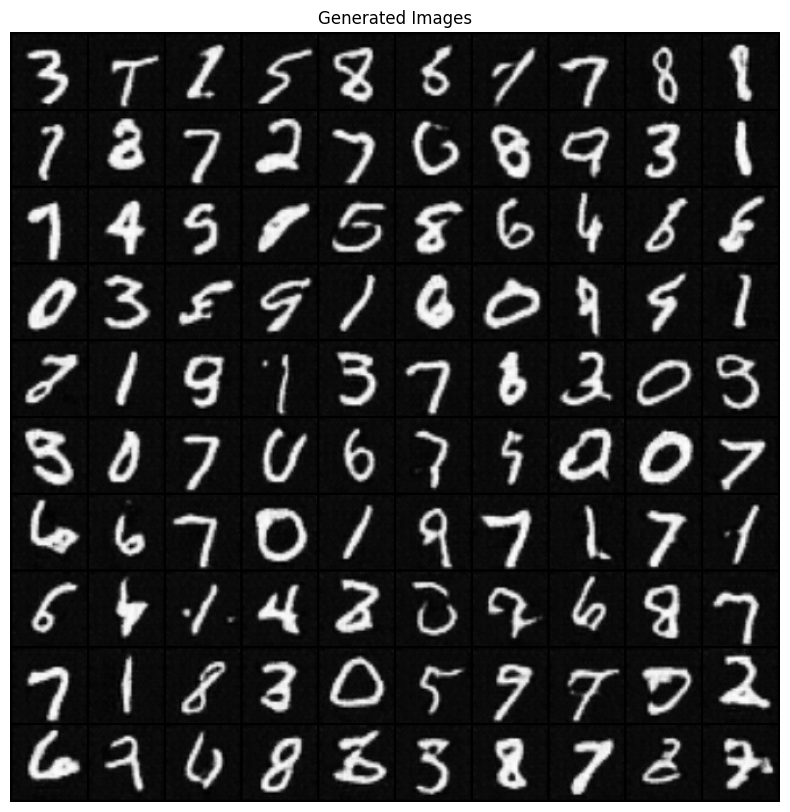

In [ ]:
fixed_noise = torch.randn(100, Z_DIM, 1, 1, device=device)

    # Generate fake images
with torch.no_grad():
    fake_images = netG(fixed_noise).detach().cpu()

    # Denormalize and display the generated images
fake_images = fake_images * 0.5 + 0.5  # Denormalize images
grid = vutils.make_grid(fake_images, nrow=10, padding=2, normalize=True)  # Create a grid of images
plt.figure(figsize=(10, 10))
plt.imshow(np.transpose(grid, (1, 2, 0)))
plt.axis("off")
plt.title("Generated Images")
plt.show()

# 3.Create and annotate fake dataset

To create fake dataset the following approach is utilised where images are selected without any unusual morphs and their relevant noise vectors. The images are saved in .png and noise vectors are saved in .txt file formats. This process was done iteratively until required images was obtained.

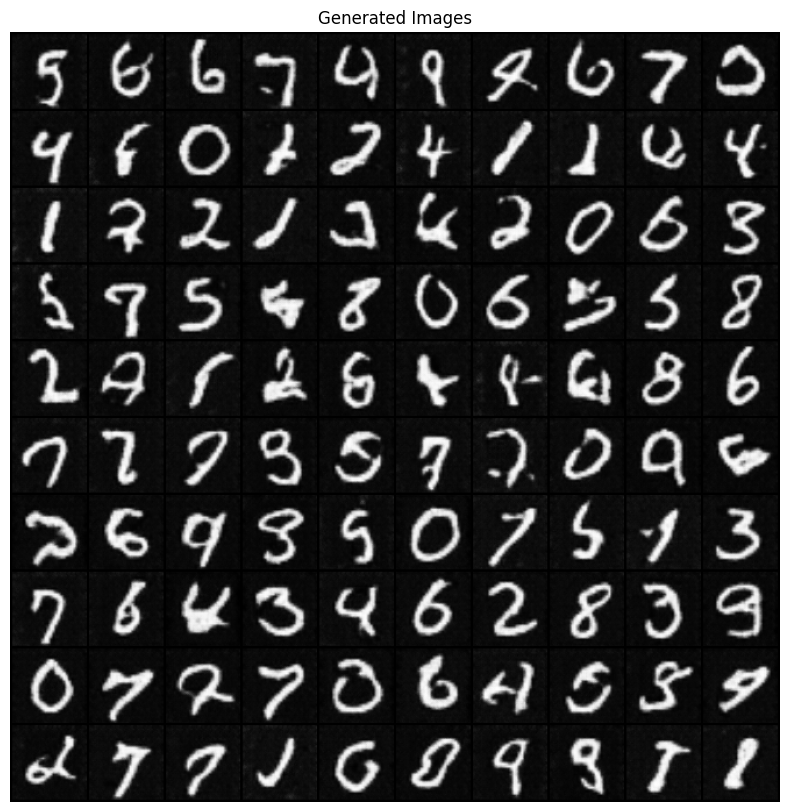

In [ ]:
output_dir = "./fake_dataset/"

# Generate random noise vectors
fixed_noise = torch.randn(100, Z_DIM, 1, 1, device=device)

# Generate fake images
with torch.no_grad():
    fake_images = []
    for i in range(100):
        noise = fixed_noise[i].unsqueeze(0)
        fake_image = netG(noise).squeeze(0).cpu()
        fake_images.append(fake_image)

# Denormalize images
fake_images = torch.stack(fake_images) * 0.5 + 0.5

# Save images and noise vectors
for i in range(100):
    # Save image as PNG
    image_path = output_dir + f"image_{i}.png"
    vutils.save_image(fake_images[i], image_path)

    # Save noise vector as TXT
    noise_path = output_dir + f"noise_{i}.txt"
    noise_vector = fixed_noise[i].view(-1).cpu().numpy()
    np.savetxt(noise_path, noise_vector)

# Visualize the generated images in a grid
grid = vutils.make_grid(fake_images, nrow=10, padding=2, normalize=True)
plt.figure(figsize=(10, 10))
plt.imshow(np.transpose(grid, (1, 2, 0)))
plt.axis("off")
plt.title("Generated Images")
plt.show()

# 4.Classification of fake dataset with real MNIST dataset from test set

The fake dataset is loaded as s1 and loaded into a dataloader. Since the images have 3 channels they are to be turned to grayscale and normalized.

In [ ]:
data_path = "fake_dataset"

# Define the transformation to apply to the images
transform = transforms.Compose([
    transforms.Grayscale(),
    transforms.ToTensor(),
    transforms.Resize(X_DIM),
    transforms.Normalize((0.5,), (0.5,))
])

# Load the dataset using torchvision.datasets.ImageFolder
s1= datasets.ImageFolder(root=data_path, transform=transform)

# Create a DataLoader to handle batching and shuffling
batch_size = 100
s1_dataloader = torch.utils.data.DataLoader(s1, batch_size=batch_size, shuffle=True)


In [ ]:
for images1, labels1 in s1_dataloader:
    print('Image batch dimensions:', images1.size())
    print('Image label dimensions:', labels1.size())
    #print(labels[:10])
    break

Image batch dimensions: torch.Size([100, 1, 64, 64])
Image label dimensions: torch.Size([100])


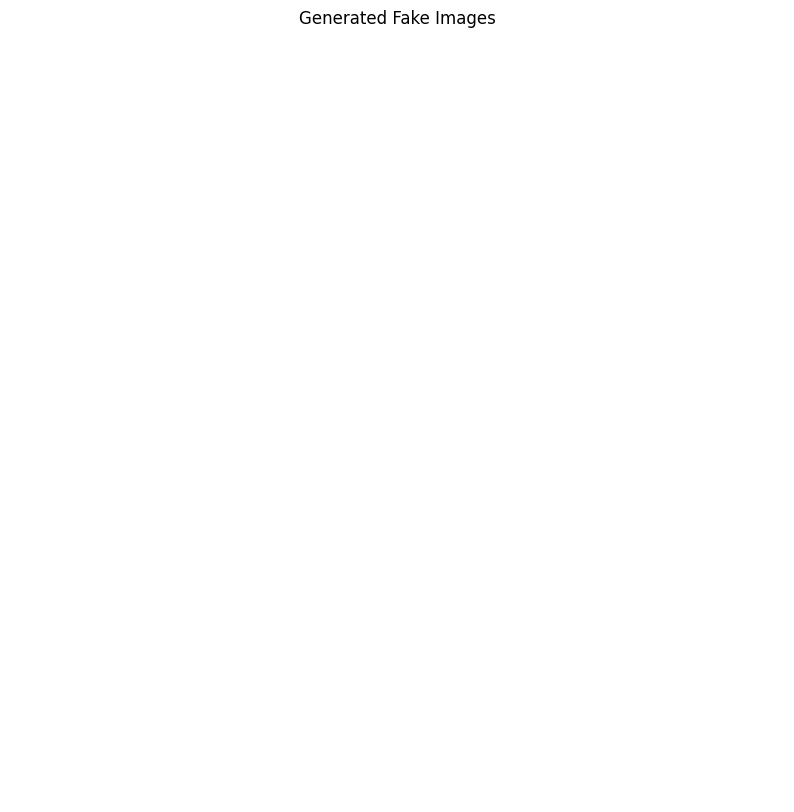

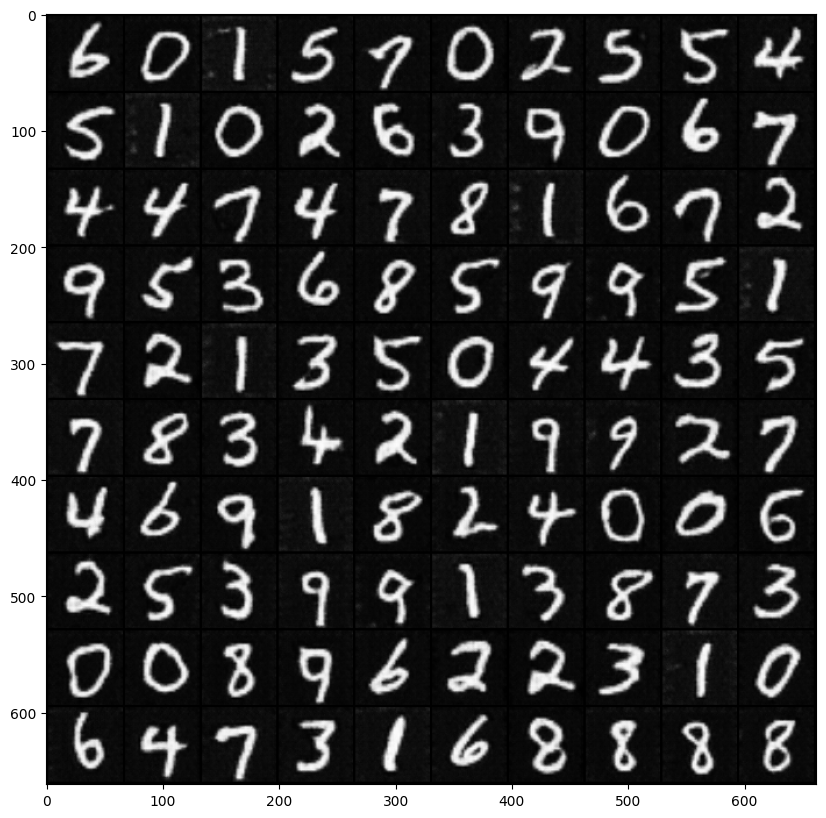

In [ ]:
# Get a batch of images
images1, labels1 = next(iter(s1_dataloader))

plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Generated Fake Images")
grid_1 = vutils.make_grid(images1[:100], nrow=10, padding=2, normalize=True)  # Create a grid of images
plt.figure(figsize=(10, 10))
plt.imshow(np.transpose(grid_1, (1, 2, 0)))
plt.show()

Creating a random 100 digit images dataset from test_dataset which is used to make s0 dataset where comparison of fake dataset is done with a real test data set.

In [ ]:
torch.manual_seed(42)

# Generate a random selection of 100 indices from the test dataset
num_samples = 100
indices = torch.randperm(len(test_dataset))[:num_samples]

# Create a subset of the test dataset using the random indices
s0= torch.utils.data.Subset(test_dataset, indices)

# Create a DataLoader to handle batching
batch_size = 100
s0_dataloader = torch.utils.data.DataLoader(s0, batch_size=batch_size, shuffle=True)

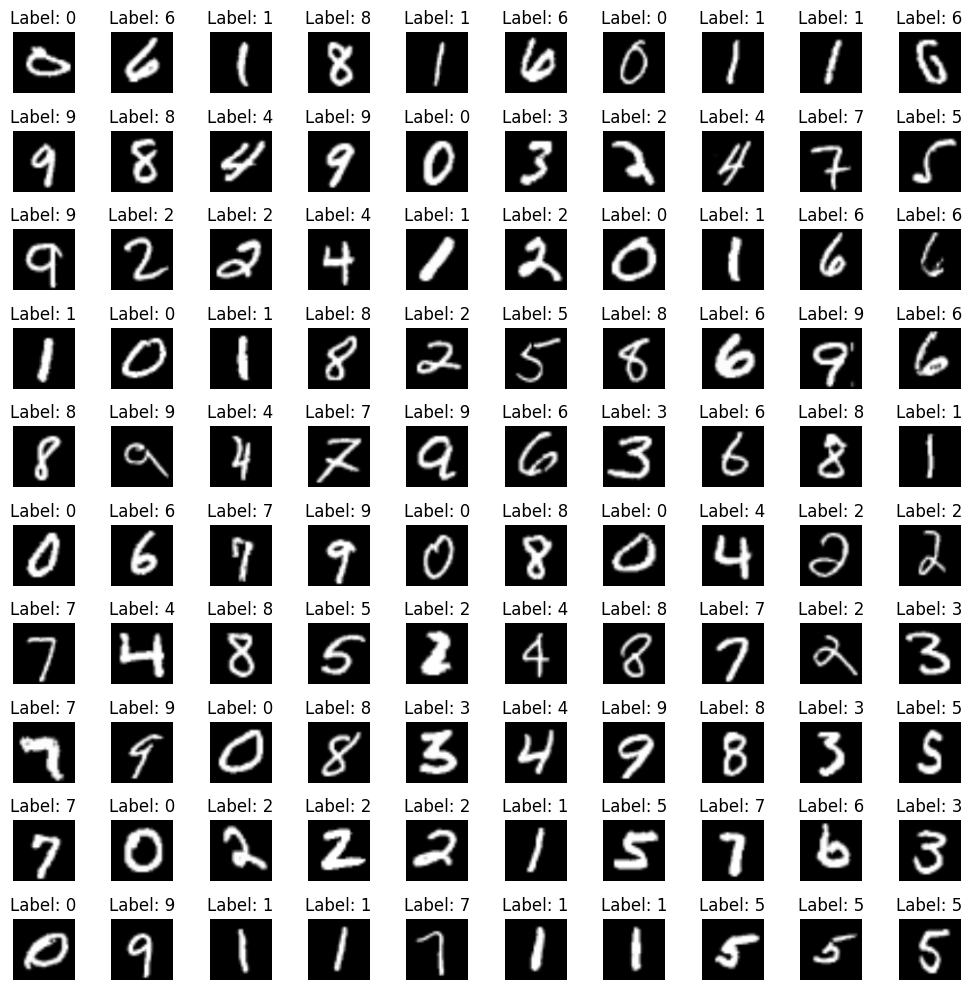

In [ ]:
for images, labels in s0_dataloader:
    # Reshape the images tensor to a 4D shape (batch_size, channels, height, width)
    images = images.reshape(batch_size, 1, 64, 64)

    # Convert images tensor to a numpy array
    images = images.numpy()

    # Create a grid of subplots with a 10x10 layout
    fig, axs = plt.subplots(10, 10, figsize=(10, 10))

    # Iterate over the images and labels
    for i in range(10):
        for j in range(10):
            # Get the image and label at the current index
            img = np.squeeze(images[i * 10 + j])
            label = labels[i * 10 + j].item()

            # Plot the image
            axs[i, j].imshow(img, cmap='gray')
            axs[i, j].axis('off')
            axs[i, j].set_title(f"Label: {label}")

    # Show the grid of images
    plt.tight_layout()
    plt.show()
    break

Defining a simple neural network for the classification purpose of real and fake MNIST datasets. Cross entropy loss is used with adam optimization and a learning rate of 0.001

In [ ]:
# Define the neural network model
class Classifier(nn.Module):
    def __init__(self):
        super(Classifier, self).__init__()
        self.features = nn.Sequential(
            nn.Linear(64*64, 512),
            nn.ReLU(inplace=True),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, 10)
        )

    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = self.features(x)
        return x

# Create an instance of the classifier model
model = Classifier()

In [ ]:
# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

Training the classifier on MNIST train_dataset.

In [ ]:
# Training loop
num_epochs = 10
for epoch in range(num_epochs):
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

        # Calculate training accuracy
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    epoch_loss = running_loss / len(train_loader)
    epoch_acc = 100 * correct / total
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%")

Epoch [1/10], Loss: 0.3276, Accuracy: 89.69%
Epoch [2/10], Loss: 0.1452, Accuracy: 95.53%
Epoch [3/10], Loss: 0.1101, Accuracy: 96.55%
Epoch [4/10], Loss: 0.0904, Accuracy: 97.15%
Epoch [5/10], Loss: 0.0803, Accuracy: 97.47%
Epoch [6/10], Loss: 0.0708, Accuracy: 97.75%
Epoch [7/10], Loss: 0.0642, Accuracy: 97.97%
Epoch [8/10], Loss: 0.0631, Accuracy: 97.92%
Epoch [9/10], Loss: 0.0566, Accuracy: 98.14%
Epoch [10/10], Loss: 0.0533, Accuracy: 98.23%


Calculating testing accuracy for whole MNIST test dataset.

In [ ]:
# Calculate the testing accuracy for the whole MNIST test dataset
model.eval()
test_correct = 0
test_total = 0

for images, labels in test_loader:
    outputs = model(images)
    _, predicted = outputs.max(1)
    test_total += labels.size(0)
    test_correct += predicted.eq(labels).sum().item()

test_accuracy = 100 * test_correct / test_total
print(f"Testing Accuracy on MNIST test dataset: {test_accuracy:.2f}%")

Testing Accuracy on MNIST test dataset: 97.49%


Finding the classification error for s1 dataset which consists of fake generated digits.

In [ ]:
# Classification errors on the fake dataset
model.eval()
fake_errors = 0
fake_total = 0

for images, _ in s1_dataloader:
    outputs = model(images)
    _, predicted = outputs.max(1)
    fake_errors += (predicted != 0).sum().item()  # Assuming 0 is the correct class for the fake dataset
    fake_total += images.size(0)

fake_error_rate = 100 * fake_errors / fake_total
print(f"Classification Error on the s1 dataset: {fake_error_rate:.2f}%")

Classification Error on the s1 dataset: 90.00%


Finding the classification error for s0 dataset which consists of random 100 digits from test dataset.

In [ ]:
# Classification errors on the random 100 digit test dataset
model.eval()
s0_errors = 0
s0_total = 0

for images, labels in s0_dataloader:
    outputs = model(images)
    _, predicted = outputs.max(1)
    s0_errors += (predicted != labels).sum().item()
    s0_total += images.size(0)

s0_error_rate = 100 * s0_errors / s0_total
print(f"Classification Error on the random 100 digit test dataset: {s0_error_rate:.2f}%")

Classification Error on the random 100 digit test dataset: 2.00%


Saving the weights of the classifier model in .pkl format.

In [ ]:
weights_path = "C.pkl"

# Save the state_dict of the classifier using pickle
with open(weights_path, 'wb') as f:
    pickle.dump(model.state_dict(), f)

print("Classifier weights saved successfully in .pkl format.")

Classifier weights saved successfully in .pkl format.
